In [1]:
import astropy
import numpy as np
import pandas as pd
import matplotlib
import scipy

from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter 
from scipy import stats

In [2]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['text.color'] = 'Black'
plt.rcParams['font.size'] = '14'
plt.rcParams['figure.figsize'] = (9, 6)

In [3]:
file = fits.open('/Users/FRANNYPACK/Downloads/grind!/research/Data/MW_foreground_SMC.fits')
file[0].header

SIMPLE  =                    T  /                                               
BITPIX  =                  -32  /                                               
NAXIS   =                    3  /                                               
NAXIS1  =                 3901  /                                               
NAXIS2  =                 3471  /                                               
NAXIS3  =                   84  /                                               
EXTEND  =                    T  /                                               
BSCALE  =    1.00000000000E+00  /                                               
BZERO   =    0.00000000000E+00  /                                               
BLANK   =                   -1  /                                               
BUNIT   = 'K       '  /                                                         
DATE-OBS= '2019-12-22T06:12:09.7'  /                                            
TELESCOP= 'ASKAP   '  /     

In [4]:
FUSE = pd.read_csv('/Users/FRANNYPACK/Downloads/grind!/research/Data/MW_H2_components.csv')

In [5]:
FUSE

,star,vcen,RA,DEC,total_log10_N
0,4U0532-664,-11.220067,83.206583,-66.370417,15.971957
1,AV104,7.389808,12.910521,-72.801528,18.391960
2,AV135,23.409269,13.206333,-72.140722,18.284586
3,AV14,2.697139,11.636083,-73.101556,17.548565
4,AV15,2.187902,11.675792,-73.415194,16.436119
...,...,...,...,...,...
182,Sk-69_94,41.290652,79.560542,-69.250278,17.699636
183,Sk-71.50,10.248197,85.180500,-71.483139,19.530947
184,Sk-71_38,1.383824,82.661542,-71.029972,18.988490
185,Sk155,3.611276,18.708333,-73.338056,15.653052


In [6]:
# relevant stars in SMC
FUSE = FUSE[(FUSE["DEC"] < -69) & (FUSE["RA"] < 28)]

In [7]:
other_elem = pd.read_csv('/Users/FRANNYPACK/Downloads/grind!/research/Data/MW_H2_other_elem.csv')

In [8]:
# relevant stars in SMC
other_elem = other_elem[(other_elem["DEC"] < -69) & (other_elem["galaxy_field"] == 'SMC') & (other_elem["RA"] < 28)]

# RELEVANT FUNCTIONS

In [9]:
def v_indx(v_val): # v_val must be in m/s
    return int((v_val - 3.99321598442 * 10 ** 4) / (-9.77198303456 * 10 ** 2))

In [10]:
# make 2D header 

def make_flat_hdr(file):
    hdr = file[0].header
    
    # Make a 2D header 
    flathdr = fits.Header()
    flathdr["NAXIS   "] = 2
    flathdr["NAXIS1  "] = hdr["NAXIS1  "]
    flathdr["NAXIS2  "] = hdr["NAXIS2  "]
    flathdr["CRPIX1  "] = hdr["CRPIX1  "]
    flathdr["CRPIX2  "] = hdr["CRPIX2  "]
    flathdr["CRVAL1  "] = hdr["CRVAL1  "]
    flathdr["CRVAL2  "] = hdr["CRVAL2  "]
    flathdr["CDELT1  "] = hdr["CDELT1  "]
    flathdr["CDELT2  "] = hdr["CDELT2  "]
    flathdr["CTYPE1  "] = hdr["CTYPE1  "]
    flathdr["CTYPE2  "] = hdr["CTYPE2  "]
    flathdr["LONPOLE "] = hdr["LONPOLE "]
    flathdr["LATPOLE "] = hdr["LATPOLE "]
    
    return flathdr

In [11]:
# gives pix vals associated w RA/DEC vals

def pix_vals(flat_FITS_hdr, ra_values, dec_values):
    wcs = WCS(flat_FITS_hdr)
    pix_arr = []
    x_pix = []
    y_pix = []
    for i in range(0, len(ra_values)):
        arr = []
        x_pix, y_pix = wcs.all_world2pix(ra_values[i], dec_values[i], 0)
        arr.append(x_pix)
        arr.append(y_pix)
        pix_arr.append(arr)
    
    return pix_arr

In [12]:
# does actual work of USM
def process_usm(cc_sum, FWHM = 30.):
    pix_len = file[0].header['CDELT2'] * 60 # ['CDELT2'] = pixel length in deg, multiply by 60 to convert to arcmin
    FWHM30_pix = FWHM / pix_len # want FWHM to be 30 arcmin, so convert to pixels
    sigma = FWHM30_pix / (2 * np.sqrt(2 * np.log(2))) # converts from FWHM to sigma, since Gaussian filter specified by sigma
    sum_smooth = gaussian_filter(cc_sum, sigma = sigma)
    sum_USM = cc_sum - sum_smooth
    return sum_USM


In [30]:
# for multiple channel maps
# computes unsharp mask over 3 km/s at a time, then adds them up (so as to not wash out the small-scale structure)

def usm_cd(v_indx_min, v_indx_max, FWHM = 30., maskb = False):
    cur = v_indx_min
    num_iterations = int((v_indx_max - v_indx_min) / 3) # 3 km/s = 3 maps at a time
    tot_cd = np.zeros((3471, 3901))
    
    for i in range(num_iterations + 1):
        if (i == num_iterations): # remainder of 3 that we have to integrate over
            if ((v_indx_max - v_indx_min) % 3 == 0): # nothing left to integrate over - we done!
                tot_cd[np.where(tot_cd < 0.)] = 0.
                return tot_cd
            else:
                cd_arr = 1.82 * (10 ** 18) * np.nansum(file[0].data[cur:v_indx_max], axis = 0) * 0.977198303456
        else: 
            cd_arr = 1.82 * (10 ** 18) * np.nansum(file[0].data[cur:cur + 3], axis = 0) * 0.977198303456
        
        if maskb:
            cd_arr = mask_border(cd_arr)
            
        tot_cd += process_usm(cd_arr, FWHM = FWHM)
        cur += 3
        
    tot_cd[np.where(tot_cd < 0.)] = 0. # do at end so negative noise cancels out with positive noise
    return tot_cd

In [14]:
# displays USM 
def show_usm(cd, vmin = 0, vmax = 0):
    plt.figure(figsize = (20, 12))
    plt.imshow(np.flip(np.abs(cd), axis = 0), cmap = 'magma', vmin = vmin, vmax = vmax)
    plt.colorbar()

In [15]:
# uses all H2 measurements from FUSE
# = more data points, but some small-scale structure lost due to integration over channel maps
# only works when working with multiple HI channel maps

def HI_H2_integrated(HI_cd_all, SS = True, LS = True, xlim = 0, xlim_up = 0, log10 = True):
    # using catalogue without velocities
    FUSE = pd.read_csv('/Users/FRANNYPACK/Downloads/grind!/research/Data/FUSE_info (SMC + LMC).csv')
    FUSE = FUSE[(FUSE["DEC_FK5"] < -69) & (FUSE["Galaxy"] == 'SMC') & (FUSE["RA_FK5"] < 28)]
    FUSE = np.array(FUSE['log10_N_MW'])
    
    HI_cd_pix = np.zeros(len(pix_arr))
    for i in range(len(pix_arr)):
        if log10:
            HI_cd_pix[i] = np.log10(HI_cd_all[int(pix_arr[i][1])][int(pix_arr[i][0])])
        else:
            HI_cd_pix[i] = HI_cd_all[int(pix_arr[i][1])][int(pix_arr[i][0])]
        
    plt.figure()
    if xlim != 0:
        FUSE = np.delete(FUSE, np.where(HI_cd_pix < xlim))
        HI_cd_pix = np.delete(HI_cd_pix, np.where(HI_cd_pix < xlim))
    if xlim_up != 0:
        FUSE = np.delete(FUSE, np.where(HI_cd_pix > xlim_up))
        HI_cd_pix = np.delete(HI_cd_pix, np.where(HI_cd_pix > xlim_up))
    plt.scatter(HI_cd_pix, FUSE)
    
    if SS:
        plt.xlabel('HI Small-Scale Column Densities')
    elif LS:
        plt.xlabel('HI Large-Scale Column Densities')
    else:
        plt.xlabel('HI Total Column Densities')
    plt.ylabel('$H_2$ Column Densities')
    
    return HI_cd_pix, stats.spearmanr(HI_cd_pix, FUSE, nan_policy = 'omit')

In [31]:
# returns array to plot HI VS H2 when HI is within +/- 3 km/s of the H2 (or C/Cl velocity)

def HI_H2_one(SS = True, LS = True, log10 = True):
    HI_cd_pix = np.zeros(len(pix_arr2))
    for i in range(len(FUSE_replaced)):
        if (SS == False) and (LS == False): # using total HI CD 
            HI_cd_all = 1.82 * (10 ** 18) * np.nansum(file[0].data[v_indx((FUSE_replaced['vcen'].iloc[i] + 3) * 10 ** 3):v_indx((FUSE_replaced['vcen'].iloc[i] - 3) * 10 ** 3),:,:], axis = 0) * 0.977198303456
        else:
            HI_cd_all = usm_cd(v_indx((FUSE_replaced['vcen'].iloc[i] + 3) * 10 ** 3), v_indx((FUSE_replaced['vcen'].iloc[i] - 3) * 10 ** 3)) # small-scale structure

        if (SS == False) and (LS == True): # using large-scale HI column density values instead
            HI_cd_tot = 1.82 * (10 ** 18) * np.nansum(file[0].data[v_indx((FUSE_replaced['vcen'].iloc[i] + 3) * 10 ** 3):v_indx((FUSE_replaced['vcen'].iloc[i] - 3) * 10 ** 3),:,:], axis = 0) * 0.977198303456 # total column density
            HI_cd_all = HI_cd_tot - HI_cd_all

        if log10:    
            HI_cd_pix[i] = np.log10(HI_cd_all[int(pix_arr2[i][1])][int(pix_arr2[i][0])])
        else:
            HI_cd_pix[i] = HI_cd_all[int(pix_arr2[i][1])][int(pix_arr2[i][0])]

    return HI_cd_pix
        
        

In [17]:
# plots total column density (LS + SS)
def col_dens(arr, vmin, vmax, title, subtitle):
    wcs = WCS(file[0].header)
    ax = plt.subplot(projection = wcs, slices = ['x','y',1], zorder = -1)
    plt.grid(b = True, which = 'major', axis = 'both', linewidth = 1, color = 'white')
    plt.xlabel('Right Ascension', fontsize = 20)
    plt.ylabel('Declination', fontsize = 20)
    plt.title(title, y = 1.06, fontsize = 22)
    plt.suptitle(subtitle, x = 0.45, y = 0.94, fontsize = 12)
    plt.imshow(arr, cmap = 'magma', vmin = vmin, vmax = vmax)
    plt.colorbar()

In [18]:
# plots total column density (LS + SS), SS column density, LS column density side-by-side
def all_cd(tot_arr, SS_arr, LS_arr, v_begin, v_end, tot_v_min, tot_v_max, LS_v_max, SS_v_min, SS_v_max):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15, 8), constrained_layout = True)
    fig.suptitle('From ' + str(v_begin) + ' km/s to ' + str(v_end) + ' km/s', y = 0.83, fontsize = 40)
    wcs = WCS(file[0].header)

    ax1.plot(projection = wcs, slices = ['x','y',1], zorder = -1)
    tot = ax1.imshow(np.flip(tot_arr, axis = 0), cmap = 'magma', vmin = tot_v_min, vmax = tot_v_max)
    ax1.set_title('Total Column Density', fontsize = 30)
    cbar1 = fig.colorbar(tot, ax = ax1, orientation = 'horizontal', pad = 0.1)
    
    ax2.plot(projection = wcs, slices = ['x','y',1], zorder = -1)
    LS = ax2.imshow(np.flip(LS_arr, axis = 0), cmap = 'magma', vmin = 0, vmax = LS_v_max)
    ax2.set_title('Large-Scale Column Density', fontsize = 30)
    fig.colorbar(LS, ax = ax2, orientation = 'horizontal', pad = 0.1)
    
    ax3.plot(projection = wcs, slices = ['x','y',1], zorder = -1)
    SS = ax3.imshow(np.flip(SS_arr, axis = 0), cmap = 'magma', vmin = SS_v_min, vmax = SS_v_max)
    ax3.set_title('Small-Scale Column Density', fontsize = 30)
    cbar = fig.colorbar(SS, ax = ax3, orientation = 'horizontal', pad = 0.1)
    

# BASIC PARAMETERS

In [19]:
file_flat_hdr = make_flat_hdr(file)

In [20]:
FUSE_no_v = pd.read_csv('/Users/FRANNYPACK/Downloads/grind!/research/Data/FUSE_output_SMC.csv')

In [21]:
x_col = FUSE_no_v['RA_FK5']
y_col = FUSE_no_v['DEC_FK5']
brightness = FUSE_no_v['log10_N_MW']

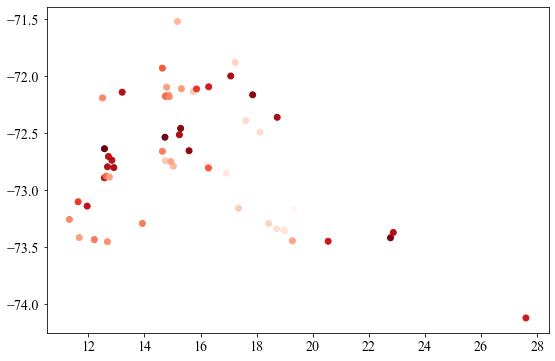

In [22]:
scatter_pts = plt.scatter(x_col, y_col, c = brightness, cmap = 'Reds')
ra_vals = scatter_pts.get_offsets()[:,0]
dec_vals = scatter_pts.get_offsets()[:,1]

In [23]:
pix_arr = pix_vals(file_flat_hdr, ra_vals, dec_vals)

In [24]:
# rearranging table into arrays for combined C/CI values

other_elem_v = [] # holds (averaged, if necessary) velocities of C/CI
other_elem_stars = [] # holds names of corresponding stars
other_elem_RA = [] # holds corresponding RA values
other_elem_DEC = [] # holds corresponding DEC values

for i in range(len(other_elem)):
    used = True # using current row of elem
    if (np.isnan(other_elem['C_I_vcen'].iloc[i]) == False) & (np.isnan(other_elem['Cl_I_vcen'].iloc[i]) == False):
        other_elem_v.append(np.mean([other_elem['C_I_vcen'].iloc[i], other_elem['Cl_I_vcen'].iloc[i]]))
    elif (np.isnan(other_elem['C_I_vcen'].iloc[i]) == False):
        other_elem_v.append(other_elem['C_I_vcen'].iloc[i])
    elif (np.isnan(other_elem['Cl_I_vcen'].iloc[i]) == False):
        other_elem_v.append(other_elem['Cl_I_vcen'].iloc[i])
    else:
        used = False
        
    if used == True: 
        other_elem_RA.append(other_elem['RA'].iloc[i])
        other_elem_DEC.append(other_elem['DEC'].iloc[i])
        other_elem_stars.append(other_elem['star'].iloc[i])

In [25]:
# replaces central velocities of H2 which have better C/Cl measurements, and deletes those which do not
FUSE_replaced = FUSE 
i = 0
while i < len(FUSE_replaced):
    if FUSE_replaced['star'].iloc[i] in other_elem_stars:
        FUSE_replaced['vcen'].iloc[i] = other_elem_v[other_elem_stars.index(FUSE_replaced['star'].iloc[i])]
        other_elem_v.pop(other_elem_stars.index(FUSE_replaced['star'].iloc[i]))
        other_elem_stars.pop(other_elem_stars.index(FUSE_replaced['star'].iloc[i]))
    else:
        FUSE_replaced = FUSE_replaced.drop(FUSE_replaced.index[i])
        i -= 1
    i += 1
        
# removing velocities of H2 that're out of range of HI
i = 0
while i < len(FUSE_replaced):
    if (v_indx(FUSE_replaced['vcen'].iloc[i] * 10 ** 3) < 0) or (v_indx(FUSE_replaced['vcen'].iloc[i] * 10 ** 3) > 300):
        FUSE_replaced = FUSE_replaced.drop(FUSE_replaced[FUSE_replaced['star'] == FUSE_replaced.iloc[i]['star']].index)
        i -= 1
    i += 1
    

/Users/FRANNYPACK/opt/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [26]:
pix_arr2 = pix_vals(file_flat_hdr, np.array(FUSE_replaced['RA']), np.array(FUSE_replaced['DEC']))

# TOTAL COLUMN DENSITY MAPS

In [32]:
file[0].data[file[0].data == -32786] = np.nan
tot_col_dens = 1.82 * (10 ** 18) * np.nansum(file[0].data, axis = 0) * 0.977198303456 # in cm^-2

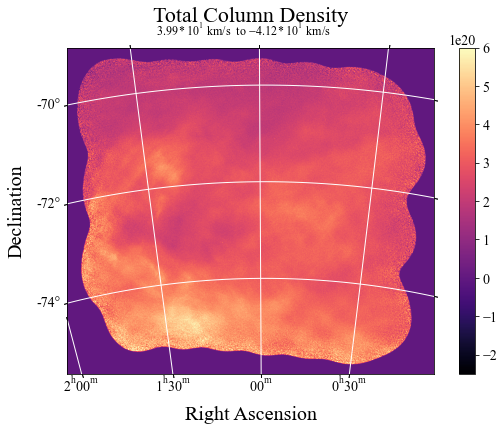

In [44]:
# over entire velocity ranges 

col_dens(tot_col_dens, -0.25 * 10 ** 21, 0.6 * 10 ** 21, 'Total Column Density', '$\mathregular{3.99 * 10^{1}}$ km/s  to $\mathregular{-4.12 * 10^{1}}$ km/s')


In [33]:
col_dens2 = 1.82 * (10 ** 18) * np.nansum(file[0].data[25:44,:,:], axis = 0) * 0.977198303456 

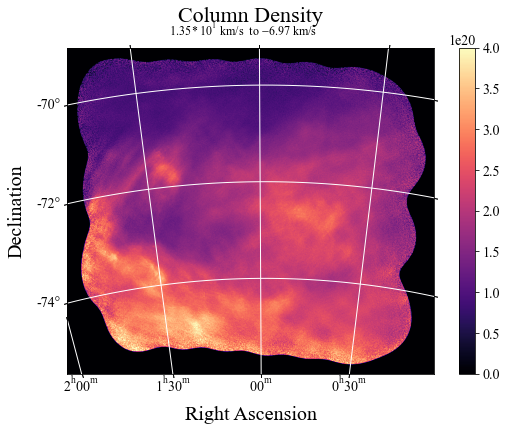

In [33]:
col_dens(col_dens2, 0.5, 4 * 10 ** 20, 'Column Density', '$\mathregular{1.35 * 10^{1}}$ km/s  to $\mathregular{-6.97}$ km/s')



In [34]:
col_dens3 = 1.82 * (10 ** 18) * np.nansum(file[0].data[44:59,:,:], axis = 0) * 0.977198303456 

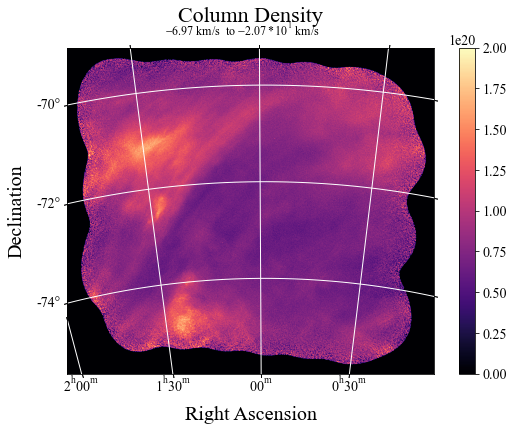

In [34]:
col_dens(col_dens3, -2 * 10 ** 3, 2 * 10 ** 20, 'Column Density', '$\mathregular{-6.97}$ km/s  to $\mathregular{-2.07 * 10^{1}}$ km/s')


# (TOTAL) ALL H2 COLUMN DENSITY AGAINST INTEGRATED HI EMISSION

In [35]:
spearman_rank_integrated_tot = np.zeros((3, 2))

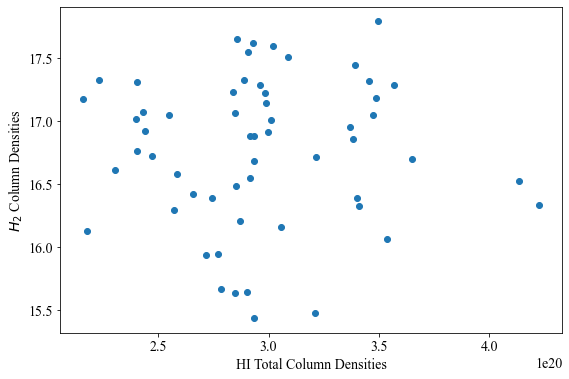

In [36]:
HI_CD_all_pix_tot, spearman_rank_integrated_tot[0,:] = HI_H2_integrated(tot_col_dens, SS = False, LS = False, log10 = False)


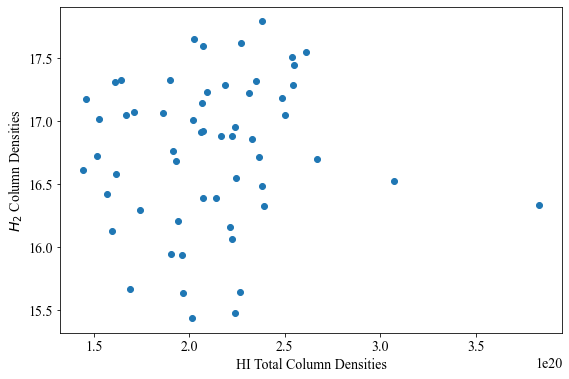

In [37]:
HI_CD_all_pix2, spearman_rank_integrated_tot[1,:] = HI_H2_integrated(col_dens2, SS = False, LS = False, log10 = False)


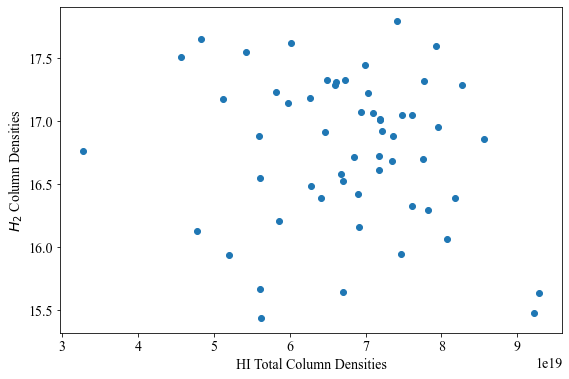

In [38]:
HI_CD_all_pix3, spearman_rank_integrated_tot[2,:] = HI_H2_integrated(col_dens3, SS = False, LS = False, log10 = False, xlim_up = 1 * 10 ** 20)


In [39]:
spearman_rank_integrated_tot

array([[ 0.07317864,  0.58852643],
       [ 0.15497796,  0.24968834],
       [-0.11264525,  0.40847349]])

# (TOTAL) SELECT H2 COLUMN DENSITY (only where C/Cl measurements = available) AGAINST HI EMISSION @ SPECIFIC VELOCITIES

In [40]:
HI_CD_otherelem_tot = HI_H2_one(SS = False, LS = False, log10 = False)

Text(0.5, 1.0, 'Using C/Cl Velocities')

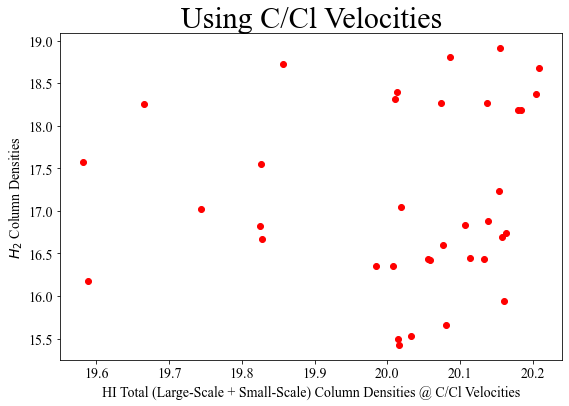

In [46]:
plt.scatter(np.log10(HI_CD_otherelem_tot), FUSE_replaced['total_log10_N'], c = 'red')
plt.xlabel('HI Total (Large-Scale + Small-Scale) Column Densities @ C/Cl Velocities')
plt.ylabel('$H_2$ Column Densities')
plt.title('Using C/Cl Velocities', fontsize = 30)

In [274]:
# gets spearman rank coefficient the velocity-centered plot above 
spearman_rank_one_tot = stats.spearmanr(HI_CD_otherelem_tot, FUSE_replaced['total_log10_N'], nan_policy = 'omit')
print(spearman_rank_one_tot)

SpearmanrResult(correlation=0.18095238095238098, pvalue=0.29090096872166976)


# (SS) COLUMN DENSITY MAPS

In [41]:
tot_col_dens_SS = usm_cd(0, 84)

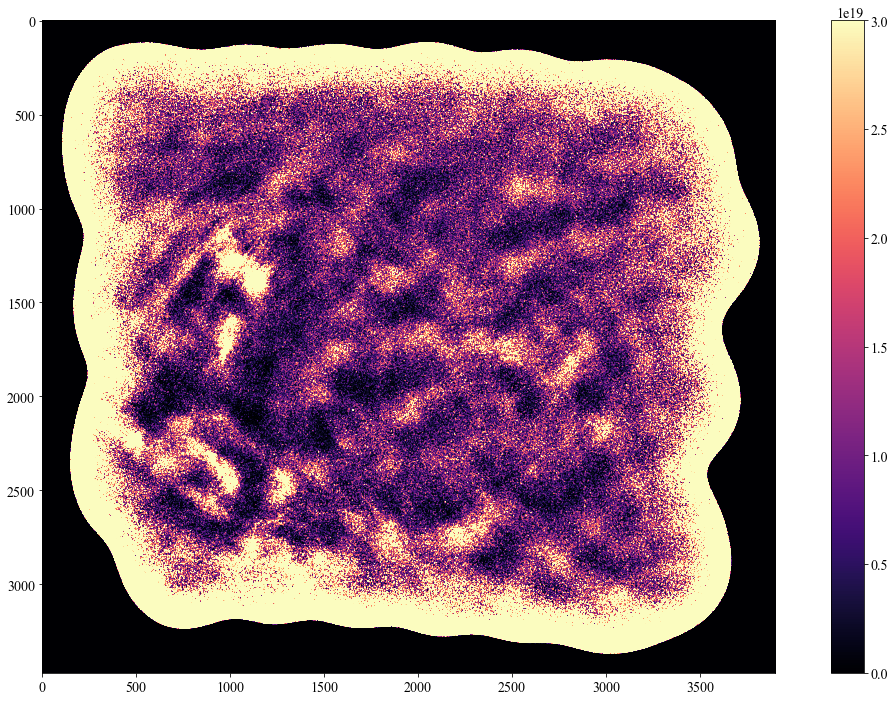

In [46]:
show_usm(tot_col_dens_SS, vmax = 0.3 * 10 ** 20)

In [47]:
col_dens2_SS = usm_cd(25, 44)

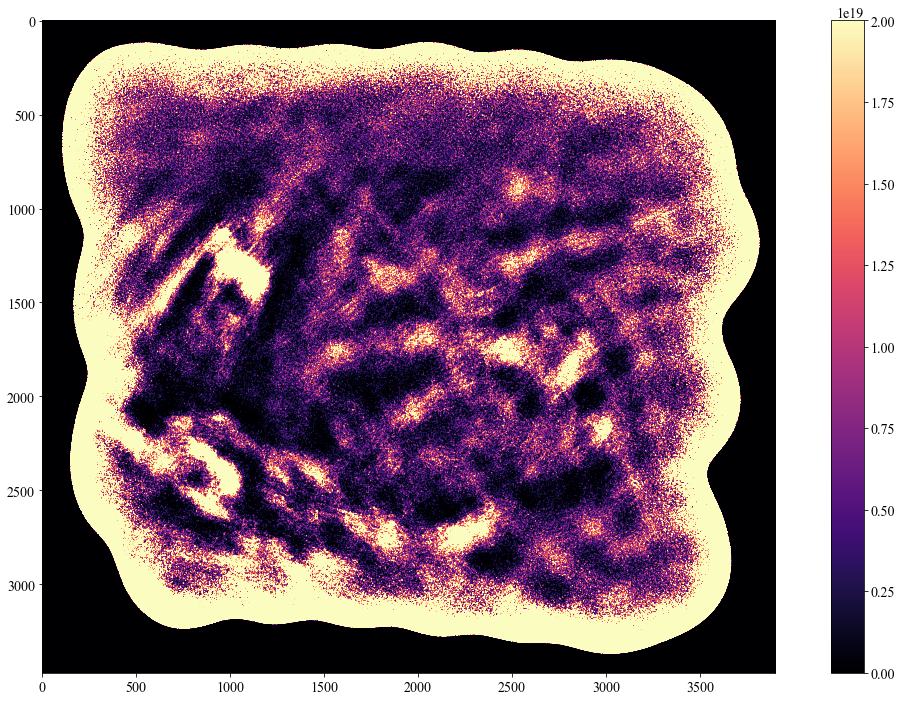

In [51]:
show_usm(col_dens2_SS, vmax = 0.2 * 10 ** 20)

In [49]:
col_dens3_SS = usm_cd(44, 59)

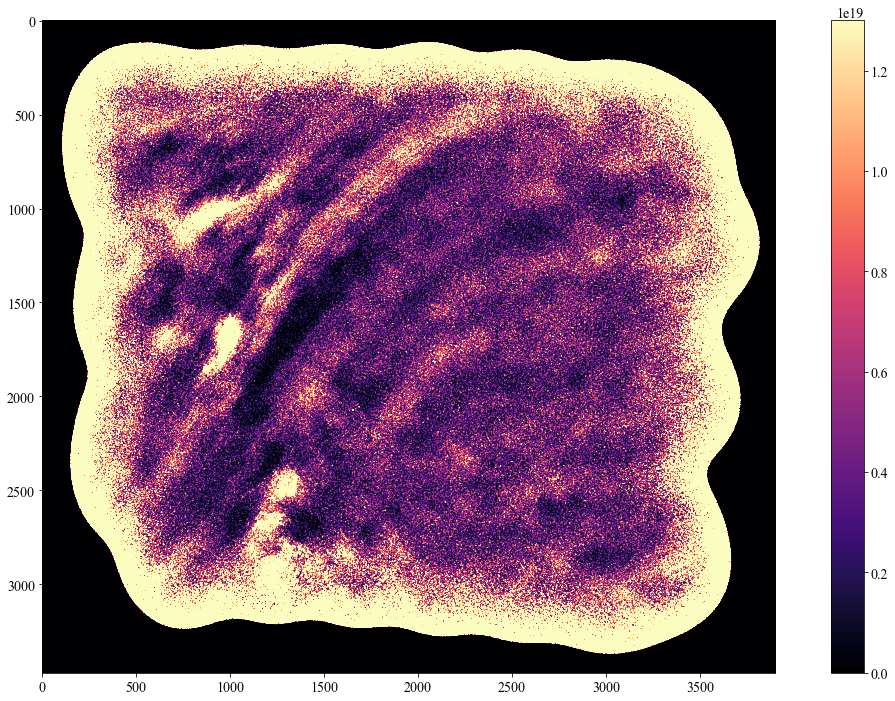

In [55]:
show_usm(col_dens3_SS, vmax = 0.13 * 10 ** 20)

# (SS) ALL H2 COLUMN DENSITY AGAINST INTEGRATED EMISSION

In [56]:
spearman_rank_integrated_SS = np.zeros((3, 2))

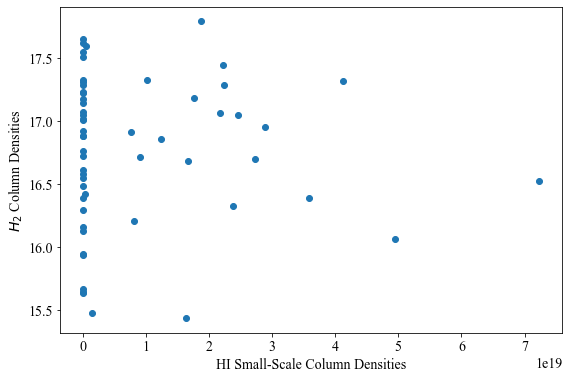

In [57]:
HI_CD_SS_pix_tot, spearman_rank_integrated_SS[0,:] = HI_H2_integrated(tot_col_dens_SS, log10 = False, xlim_up = 1.5 * 10 ** 20)


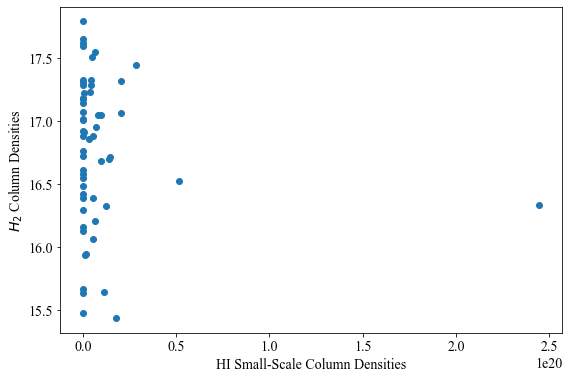

In [58]:
HI_CD_SS_pix2, spearman_rank_integrated_SS[1,:] = HI_H2_integrated(col_dens2_SS, log10 = False)

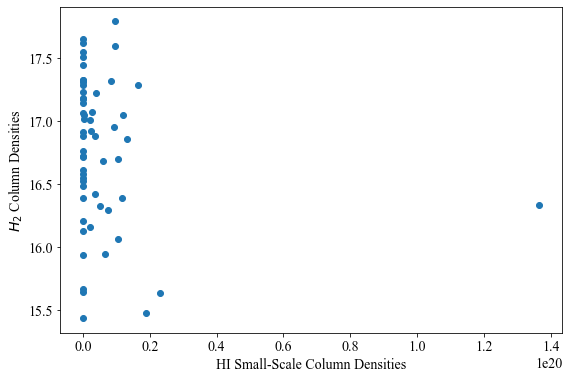

In [59]:
HI_CD_SS_pix3, spearman_rank_integrated_SS[2,:] = HI_H2_integrated(col_dens3_SS, log10 = False)

In [60]:
spearman_rank_integrated_SS

array([[ 0.00574778,  0.96646471],
       [-0.06990227,  0.60537174],
       [-0.15013751,  0.26496461]])

Spearman Rank Correlation Coefficient seems to show that the slightly-negative correlations aren't statistically significant

# (SS) SELECT H2 COLUMN DENSITY (only where C/Cl measurements = available) AGAINST HI EMISSION @ SPECIFIC VELOCITIES

In [61]:
HI_CD_otherelem_SS = HI_H2_one(log10 = False)

/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_67778/529495350.py:1: RuntimeWarning: divide by zero encountered in log10
  plt.scatter(np.log10(HI_CD_otherelem_SS), FUSE_replaced['total_log10_N'], c = 'red')


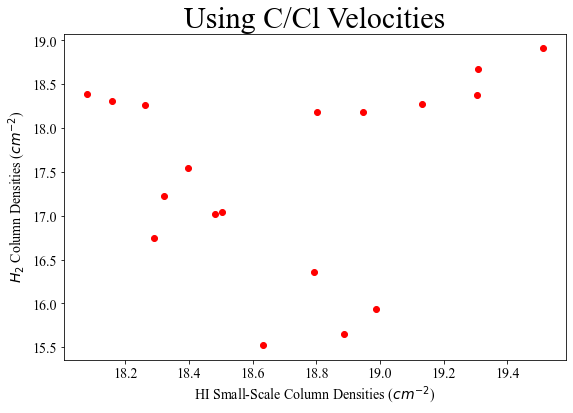

In [62]:
plt.scatter(np.log10(HI_CD_otherelem_SS), FUSE_replaced['total_log10_N'], c = 'red')
plt.xlabel('HI Small-Scale Column Densities ($cm^{-2}$)')
plt.ylabel('$H_2$ Column Densities ($cm^{-2}$)')
plt.title('Using C/Cl Velocities', fontsize = 30)
plt.savefig('/Users/FRANNYPACK/Downloads/grind!/research/Images/SMC_HI_H2.jpg')

In [63]:
# gets spearman rank coefficient for each single channel map - value + p-value for each velocity
spearman_rank_one_SS = stats.spearmanr(HI_CD_otherelem_SS, FUSE_replaced['total_log10_N'], nan_policy = 'omit')
print(spearman_rank_one_SS)
    

SpearmanrResult(correlation=0.30277718417610977, pvalue=0.07266216757207186)


So Spearman Rank Correlation Coefficient shows that the slightly-positive correlation is not statistically significant

# (LS) COLUMN DENSITY MAPS

In [64]:
tot_col_dens_LS = tot_col_dens - tot_col_dens_SS

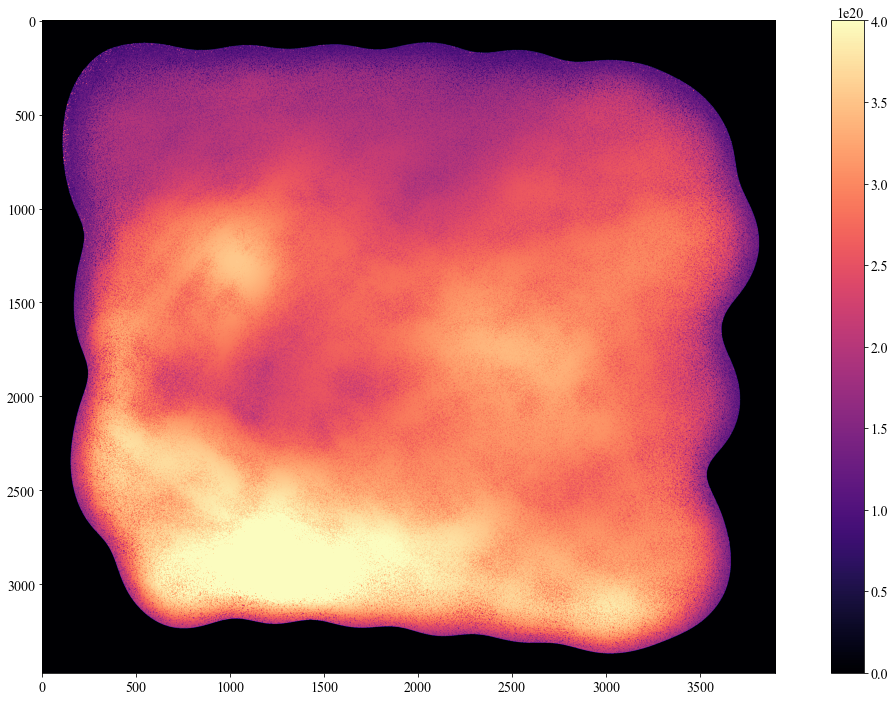

In [65]:
show_usm(tot_col_dens_LS, vmax = 4 * 10 ** 20)

In [66]:
col_dens2_LS = col_dens2 - col_dens2_SS

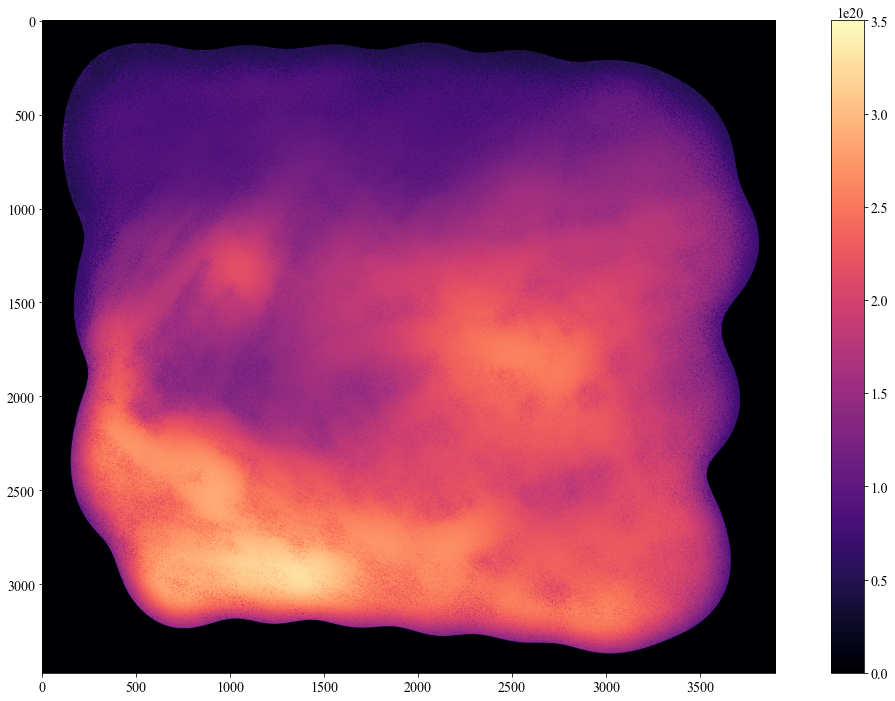

In [68]:
show_usm(col_dens2_LS, vmax = 3.5 * 10 ** 20)

In [69]:
col_dens3_LS = col_dens3 - col_dens3_SS

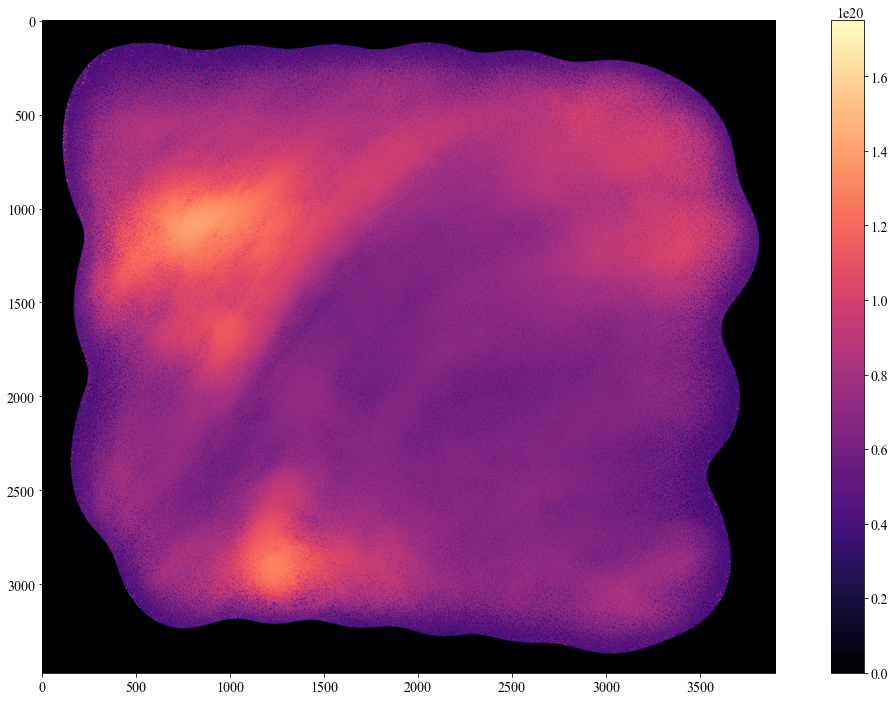

In [70]:
show_usm(col_dens3_LS, vmax = 1.75 * 10 ** 20)

# (LS) ALL H2 COLUMN DENSITY AGAINST INTEGRATED HI EMISSION

In [71]:
spearman_rank_integrated_LS = np.zeros((3, 2))

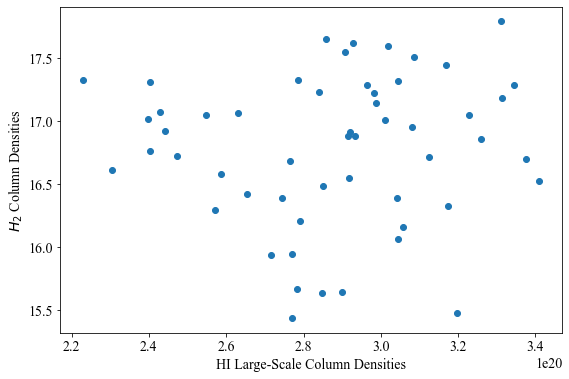

In [81]:
HI_CD_LS_pix_tot, spearman_rank_integrated_LS[0,:] = HI_H2_integrated(tot_col_dens_LS, SS = False, log10 = False, xlim = 2.2 * 10 ** 20)


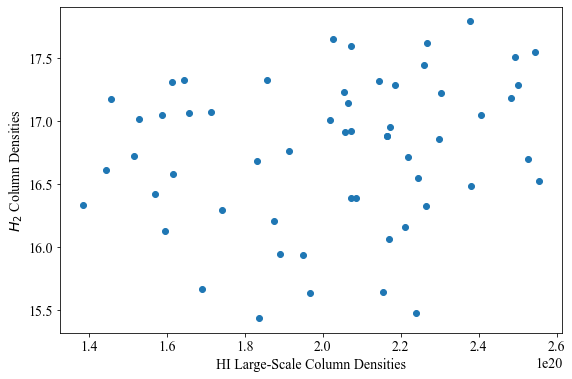

In [73]:
HI_CD_LS_pix2, spearman_rank_integrated_LS[1,:] = HI_H2_integrated(col_dens2_LS, SS = False, log10 = False)

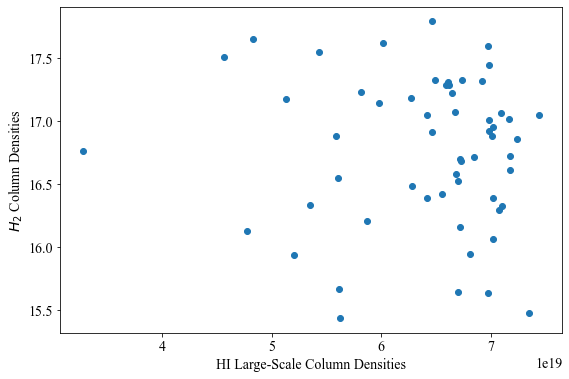

In [74]:
HI_CD_LS_pix3, spearman_rank_integrated_LS[2,:] = HI_H2_integrated(col_dens3_LS, SS = False, log10 = False)

In [75]:
spearman_rank_integrated_LS

array([[ 0.12468077,  0.36903278],
       [ 0.20786881,  0.12075591],
       [-0.12328234,  0.36091001]])

The Spearman Rank Correlation Coefficients show inconsistent correlation and statistically insignificant p-values

# (LS) SELECT H2 COLUMN DENSITY (only where C/Cl measurements = available) AGAINST HI EMISSION @ SPECIFIC VELOCITIES

In [76]:
HI_CD_otherelem_LS = HI_H2_one(SS = False, log10 = False)

Text(0.5, 1.0, 'Using C/Cl Velocities')

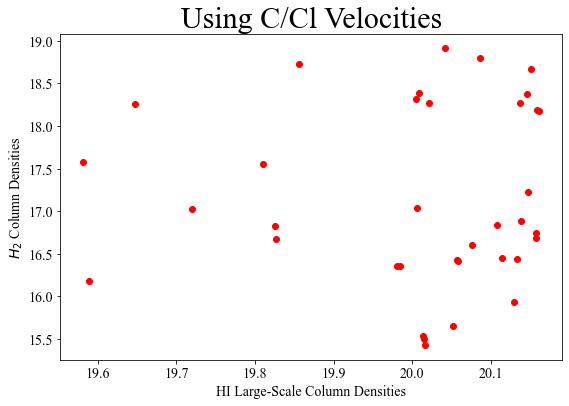

In [77]:
plt.scatter(np.log10(HI_CD_otherelem_LS), FUSE_replaced['total_log10_N'], c = 'red')
plt.xlabel('HI Large-Scale Column Densities')
plt.ylabel('$H_2$ Column Densities')
plt.title('Using C/Cl Velocities', fontsize = 30)

In [78]:
# gets spearman rank coefficient the velocity-centered plot above 
spearman_rank_one_LS = stats.spearmanr(HI_CD_otherelem_LS, FUSE_replaced['total_log10_N'], nan_policy = 'omit')
print(spearman_rank_one_LS)

SpearmanrResult(correlation=0.10244530244530246, pvalue=0.5521465174318699)


Hmmm - Spearman Rank Correlation Coefficient still showing little statistical significance and correlation

# CALCULATING FRACTION OF SMALL-SCALE/LARGE-SCALE IN TOTAL COLUMN DENSITY

Using non-log-10 values (but only those > 0 for SS, since some are < 0)

For integrated values

In [79]:
SS_frac_tot = np.nansum(HI_CD_SS_pix_tot[np.where(HI_CD_SS_pix_tot > 0)]) / np.nansum(HI_CD_all_pix_tot[np.where(HI_CD_SS_pix_tot > 0)])
SS_frac_tot

0.06411843275682526

In [82]:
LS_frac_tot = np.nansum(HI_CD_LS_pix_tot) / np.nansum(HI_CD_all_pix_tot)
LS_frac_tot


0.920273846653613

For values using C/Cl velocities

In [83]:
SS_frac_otherelem = np.nansum(HI_CD_otherelem_SS[np.where(HI_CD_otherelem_SS > 0)]) / np.nansum(HI_CD_otherelem_tot[np.where(HI_CD_otherelem_SS > 0)])
SS_frac_otherelem


0.06909472352808856

In [84]:
LS_frac_otherelem = np.nansum(HI_CD_otherelem_LS[np.where(HI_CD_otherelem_SS > 0)]) / np.nansum(HI_CD_otherelem_tot[np.where(HI_CD_otherelem_SS > 0)])
LS_frac_otherelem


0.9309052764719115

Checking robustness of calculation using other integrated values

In [85]:
SS_frac2 = np.nansum(HI_CD_SS_pix2[np.where(HI_CD_SS_pix2 > 0)]) / np.nansum(HI_CD_all_pix2[np.where(HI_CD_SS_pix2 > 0)])
SS_frac2


0.08100723425036306

In [86]:
LS_frac2 = np.nansum(HI_CD_LS_pix2[np.where(HI_CD_SS_pix2 > 0)]) / np.nansum(HI_CD_all_pix2[np.where(HI_CD_SS_pix2 > 0)])
LS_frac2


0.918992765749637

In [87]:
SS_frac3 = np.nansum(HI_CD_SS_pix3[np.where(HI_CD_SS_pix3 > 0)]) / np.nansum(HI_CD_all_pix3[np.where(HI_CD_SS_pix3 > 0)])
SS_frac3


0.16804248160154553

In [88]:
LS_frac3 = np.nansum(HI_CD_LS_pix3[np.where(HI_CD_SS_pix3 > 0)]) / np.nansum(HI_CD_all_pix3[np.where(HI_CD_SS_pix3 > 0)])
LS_frac3


0.8912219141303829

For entire column density arrays

In [89]:
np.nansum(tot_col_dens_SS[np.where(tot_col_dens_SS > 0)]) / np.nansum(tot_col_dens[np.where(tot_col_dens_SS > 0)])

0.17904771053808988

In [90]:
np.nansum(tot_col_dens_LS[np.where(tot_col_dens_SS > 0)]) / np.nansum(tot_col_dens[np.where(tot_col_dens_SS > 0)])

0.8209524241367254

In [91]:
np.nansum(col_dens2_SS[np.where(col_dens2_SS > 0)]) / np.nansum(col_dens2[np.where(col_dens2_SS > 0)])

0.1588095730069157

In [92]:
np.nansum(col_dens2_LS[np.where(col_dens2_SS > 0)]) / np.nansum(col_dens2[np.where(col_dens2_SS > 0)])

0.8411900744822238

In [93]:
np.nansum(col_dens3_SS[np.where(col_dens3_SS > 0)]) / np.nansum(col_dens3[np.where(col_dens3_SS > 0)])

0.22371835505150517

In [94]:
np.nansum(col_dens3_LS[np.where(col_dens3_SS > 0)]) / np.nansum(col_dens3[np.where(col_dens3_SS > 0)])

0.7762816446236211

# ALL COLUMN DENSITY PLOTS TOGETHER

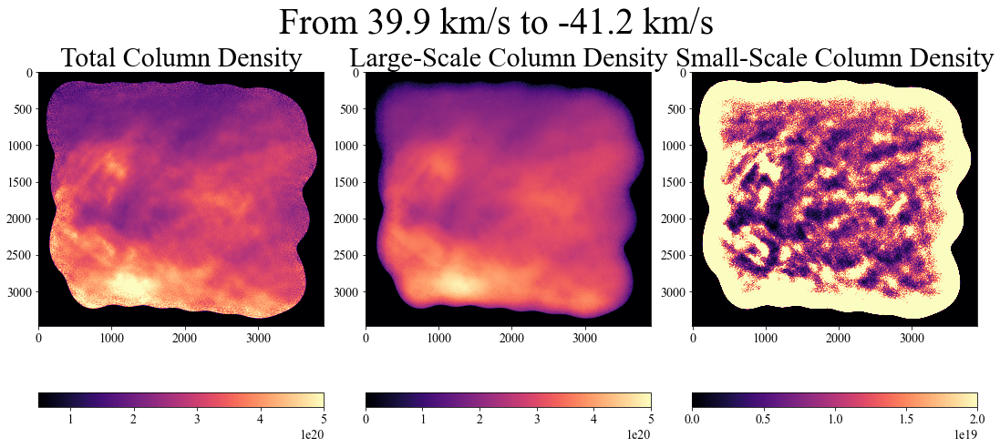

In [98]:
all_cd(tot_col_dens, tot_col_dens_SS, tot_col_dens_LS, 39.9, -41.2, 0.5 * 10 ** 20, 5 * 10 ** 20, 5 * 10 ** 20, 0 * 10 ** 19, 0.2 * 10 ** 20)



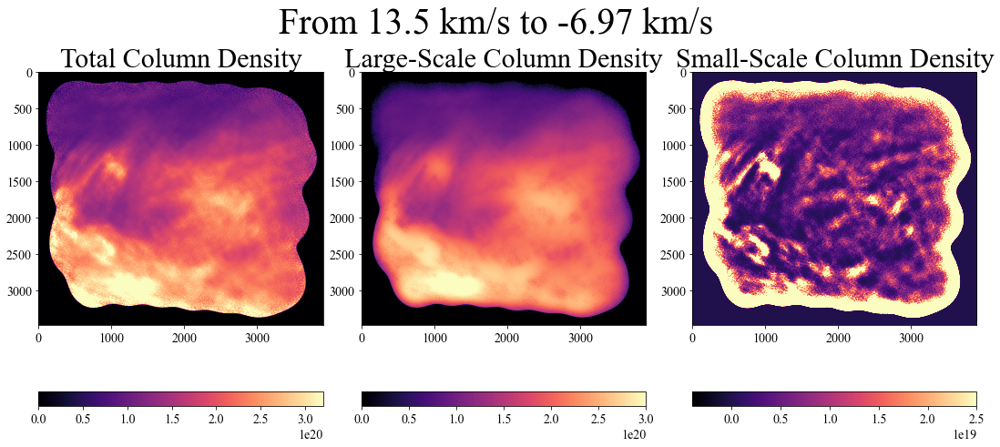

In [99]:
all_cd(col_dens2, col_dens2_SS, col_dens2_LS, 13.5, -6.97, 0, 3.2 * 10 ** 20, 3 * 10 ** 20, -0.4 * 10 ** 19, 2.5 * 10 ** 19)



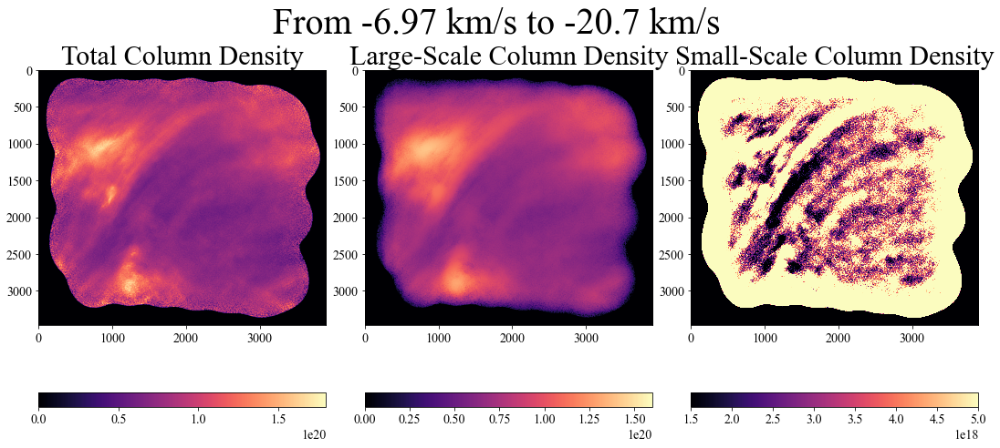

In [103]:
all_cd(col_dens3, col_dens3_SS, col_dens3_LS, -6.97, -20.7, 0, 1.8 * 10 ** 20, 1.6 * 10 ** 20, 1.5 * 10 ** 18, 0.5 * 10 ** 19)

